In [56]:
import pandas as pd

# Load the CSV file
csv_path = 'SPARTACUS_data//SPARTACUS - Spatial Dataset for Climate in Austria Datensatz_196101_202505.csv'
df_spartacus_monthly = pd.read_csv(csv_path)

# Display the first few rows
print(df_spartacus_monthly.head())

# Ensure consistent sorting (optional but safer)
df_spartacus_monthly = df_spartacus_monthly.sort_values(['lon', 'lat']).reset_index(drop=True)

# Create a unique sites DataFrame
unique_sites = df_spartacus_monthly[['lat', 'lon']].drop_duplicates().reset_index(drop=True)
unique_sites['site'] = unique_sites.index + 1  # Optional: start at 1 instead of 0

# Merge the site numbers back into the main DataFrame
df_spartacus_monthly = df_spartacus_monthly.merge(unique_sites, on=['lat', 'lon'], how='left')




                     time  RR [kg m-2]    SA [s]  TM [degree_Celsius]  \
0  1961-01-01T00:00+00:00          NaN  400320.0                -14.0   
1  1961-02-01T00:00+00:00          NaN  463680.0                -11.6   
2  1961-03-01T00:00+00:00          NaN  791640.0                -10.6   
3  1961-04-01T00:00+00:00          NaN  421560.0                 -6.0   
4  1961-05-01T00:00+00:00          NaN  448200.0                 -6.7   

         lat        lon  
0  46.799767  10.731935  
1  46.799767  10.731935  
2  46.799767  10.731935  
3  46.799767  10.731935  
4  46.799767  10.731935  


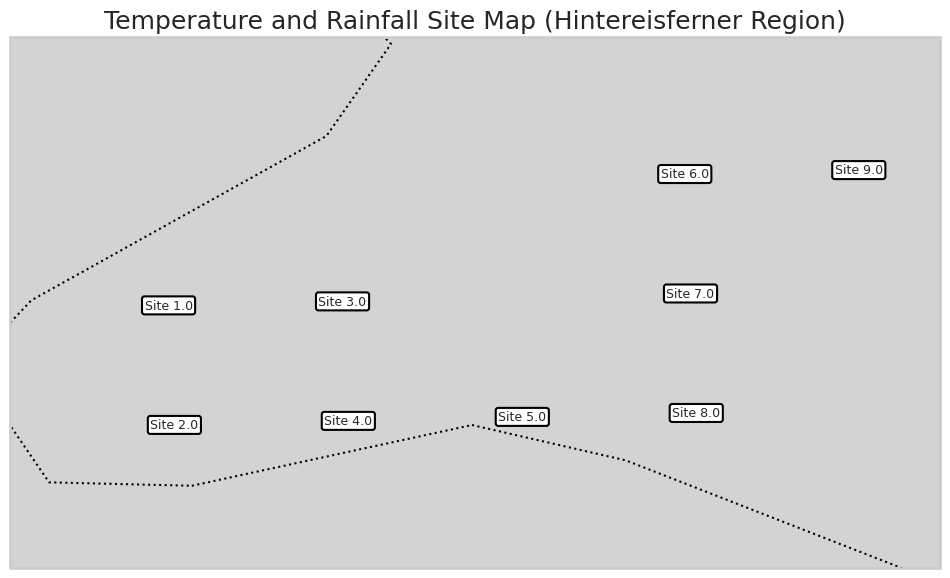

         lat        lon  site
0  46.799767  10.731935     1
1  46.790770  10.732373     2
2  46.800068  10.745030     3
3  46.791073  10.745466     4
4  46.791374  10.758560     5
5  46.809654  10.770790     6
6  46.800663  10.771222     7
7  46.791668  10.771654     8
8  46.809950  10.783888     9


In [57]:
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature


# Plot the map
fig, ax = plt.subplots(figsize=(12, 12), subplot_kw={'projection': ccrs.PlateCarree()})
ax.set_title('Temperature and Rainfall Site Map (Hintereisferner Region)')
ax.set_extent([10.72, 10.79, 46.78, 46.82], crs=ccrs.PlateCarree())

# Add features
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAND, color='lightgray')
ax.add_feature(cfeature.OCEAN, color='lightblue')

# Plot site labels
for _, row in unique_sites.iterrows():
    ax.text(row['lon'], row['lat'], f"Site {row['site']}", fontsize=9,
            ha='center', va='center', bbox=dict(boxstyle='round,pad=0.2', fc='white', ec='black'))

plt.show()

# You can inspect the assigned site numbers:
print(unique_sites)

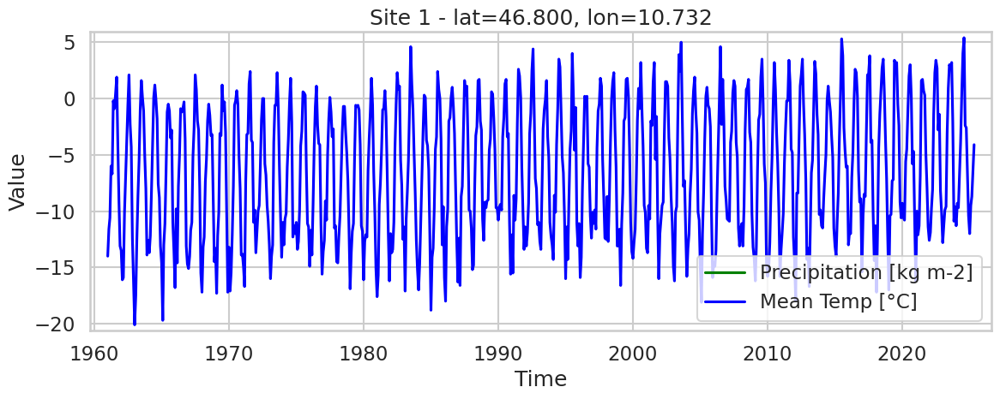

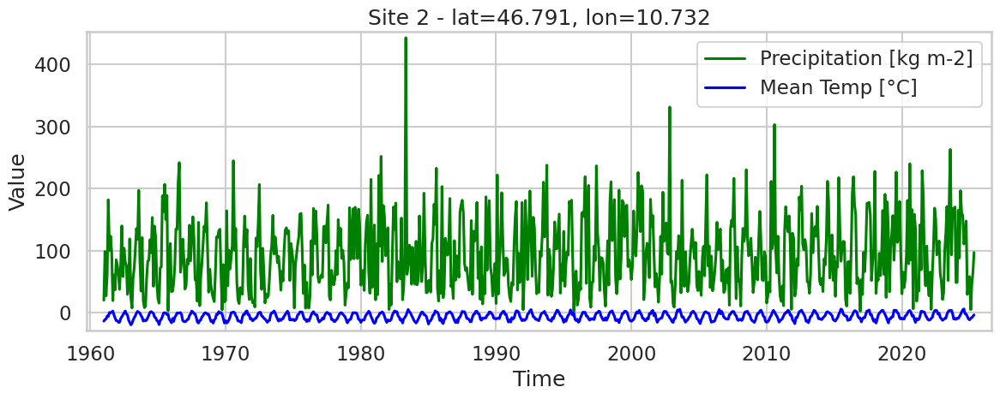

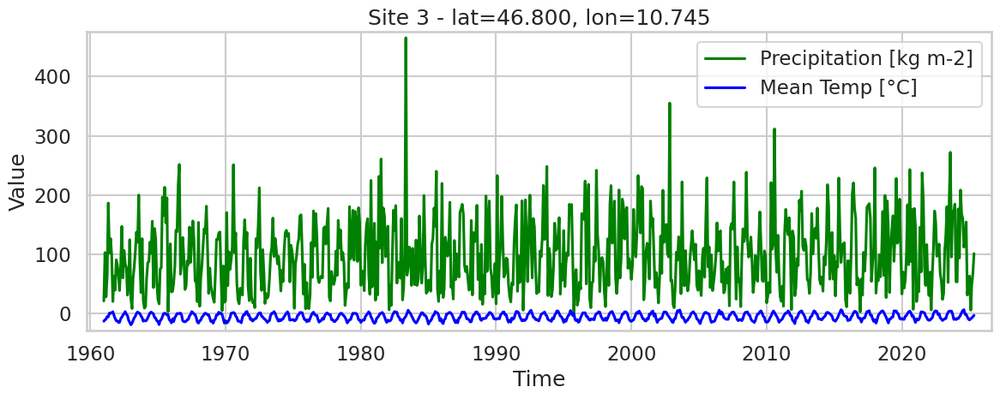

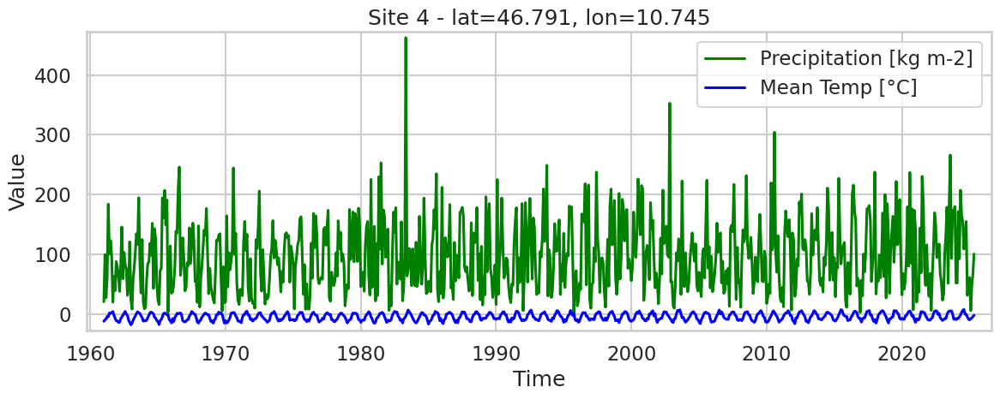

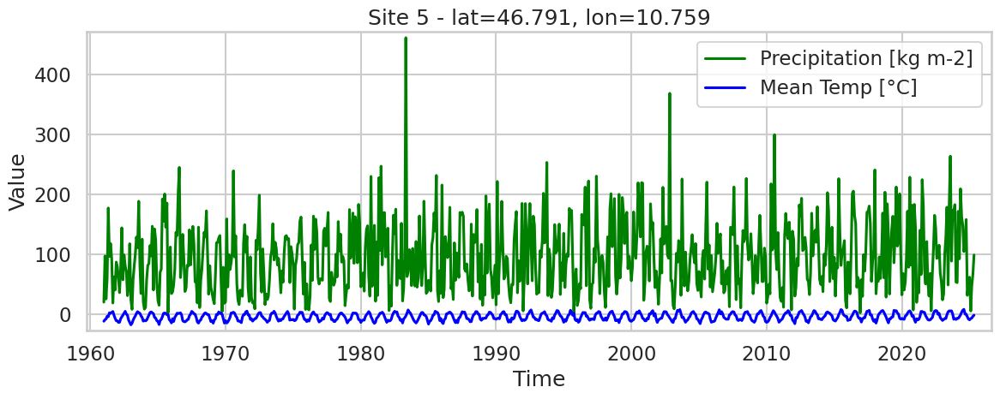

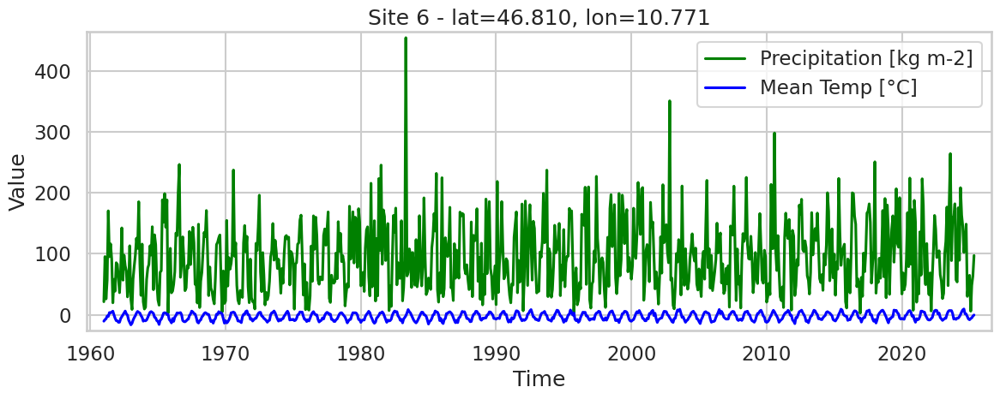

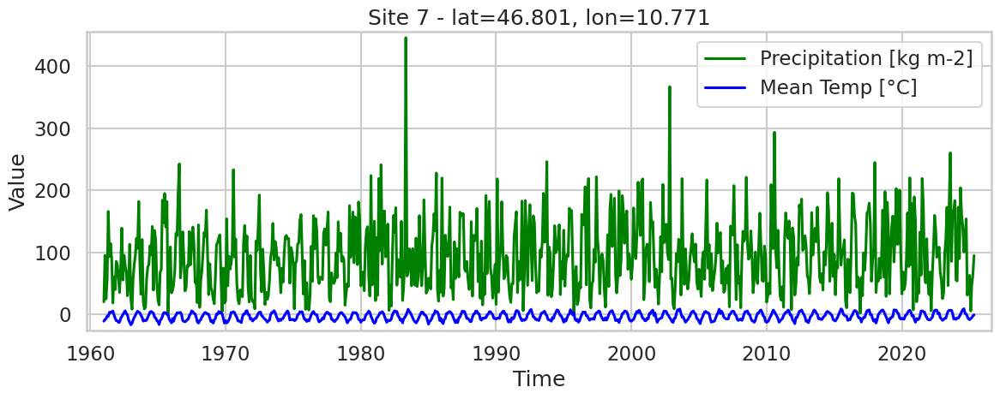

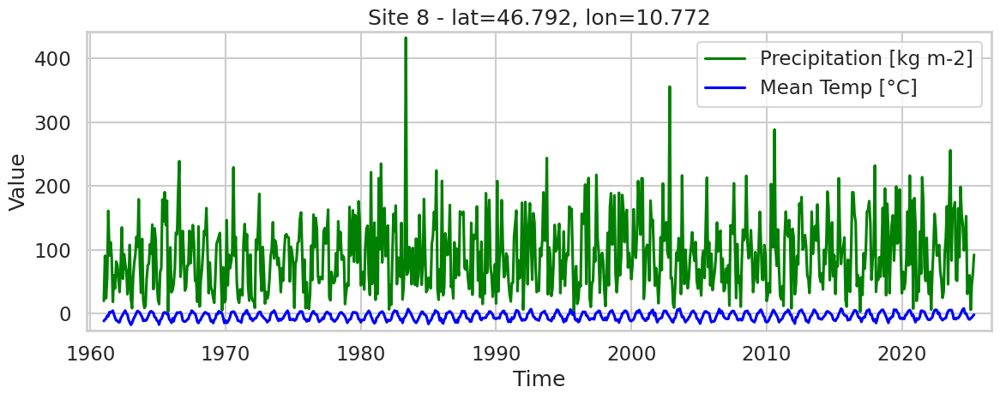

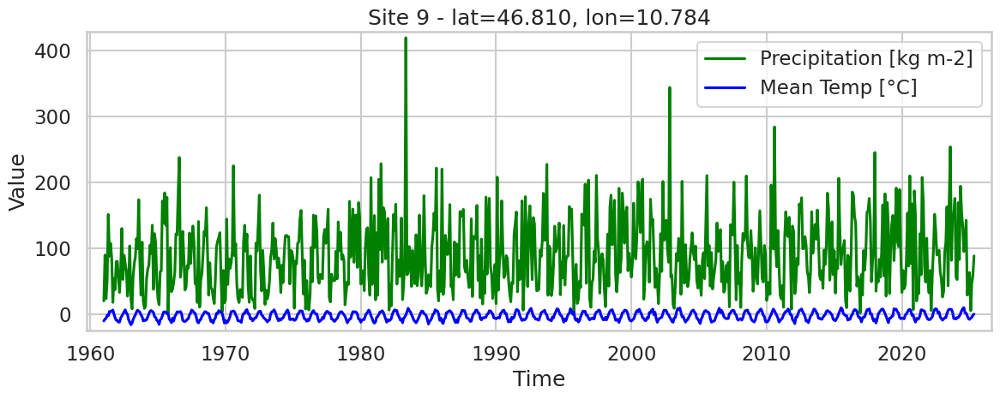

In [58]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Convert time column to datetime
df_spartacus_monthly['time'] = pd.to_datetime(df_spartacus_monthly['time'])

# Create output folder
output_dir = 'glacier_point_timeseries_csv'
os.makedirs(output_dir, exist_ok=True)

# Group by site, lat, lon for consistency in titles
grouped = df_spartacus_monthly.groupby(['site', 'lat', 'lon'])

# Iterate over each location
for (site, lat, lon), group in grouped:
    group = group.sort_values('time')  # Ensure chronological order

    plt.figure(figsize=(12, 5))
    
    if 'RR [kg m-2]' in group:
        plt.plot(group['time'], group['RR [kg m-2]'], label='Precipitation [kg m-2]', color='green')
    
    if 'TM [degree_Celsius]' in group:
        plt.plot(group['time'], group['TM [degree_Celsius]'], label='Mean Temp [°C]', color='blue')

    # Add site number and coordinates to the title
    plt.title(f'Site {site} - lat={lat:.3f}, lon={lon:.3f}')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Optional: Save the plot to a PNG file
    # filename = f'timeseries_site{site}_lat{lat:.3f}_lon{lon:.3f}.png'
    # filepath = os.path.join(output_dir, filename)
    # plt.savefig(filepath)
    # plt.close()


Hmmm, monthly average temperatures might not be useful, might have to find another metric, days over 90th percentile

In [59]:
# Ensure time column is datetime
df_spartacus_monthly['time'] = pd.to_datetime(df_spartacus_monthly['time'])

# Define hydrological year based on Oct 1 cutoff
def get_hydro_year(dt):
    return dt.year + 1 if dt.month >= 10 else dt.year

# Apply function to create new column
df_spartacus_monthly['hydrological_year'] = df_spartacus_monthly['time'].apply(get_hydro_year)

# Preview result
df_spartacus_monthly.head()


df_hef_combined_MB = pd.read_pickle("hef_MB_combined.pkl")

df_hef_combined_MB.head()
df_spartacus_monthly.head()

,time,RR [kg m-2],SA [s],TM [degree_Celsius],lat,lon,site,hydrological_year
0,1961-01-01 00:00:00+00:00,NaN,400320.0,-14.0,46.799767,10.731935,1,1961
1,1961-02-01 00:00:00+00:00,NaN,463680.0,-11.6,46.799767,10.731935,1,1961
2,1961-03-01 00:00:00+00:00,NaN,791640.0,-10.6,46.799767,10.731935,1,1961
3,1961-04-01 00:00:00+00:00,NaN,421560.0,-6.0,46.799767,10.731935,1,1961
4,1961-05-01 00:00:00+00:00,NaN,448200.0,-6.7,46.799767,10.731935,1,1961


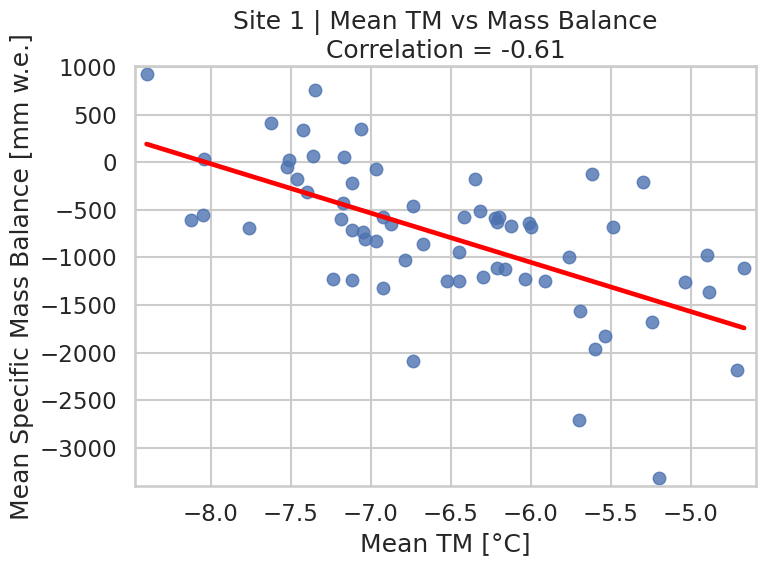

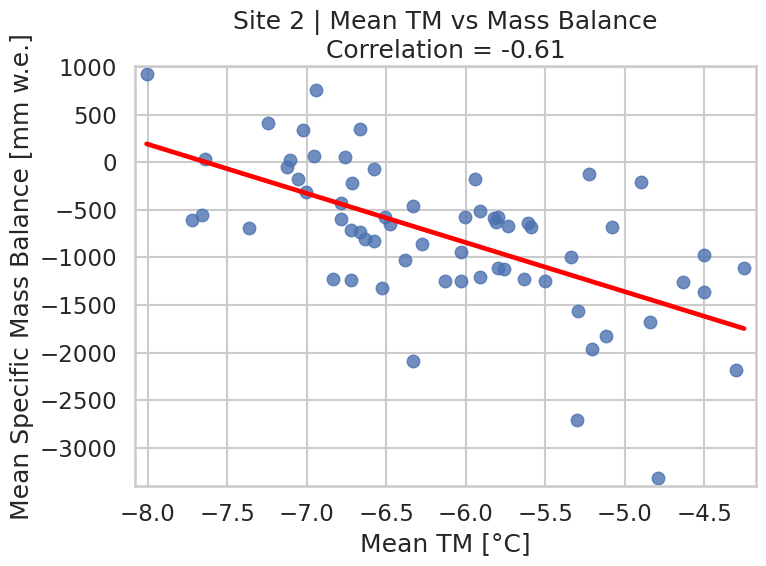

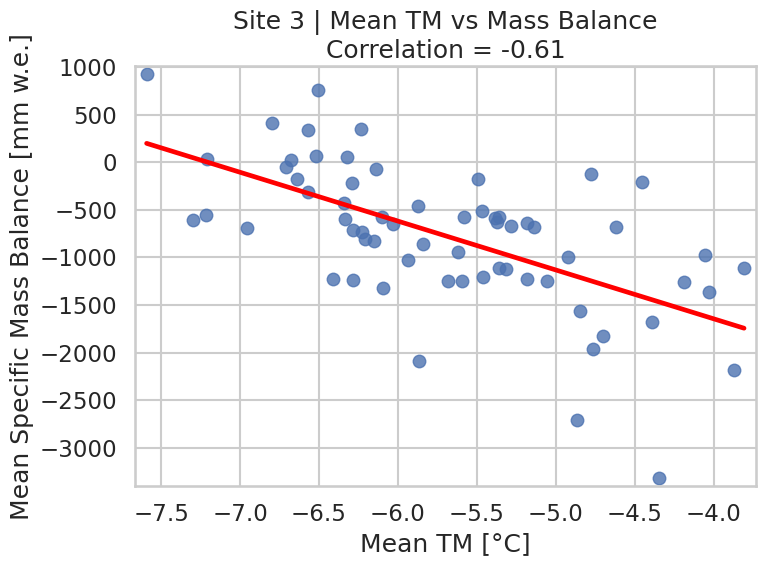

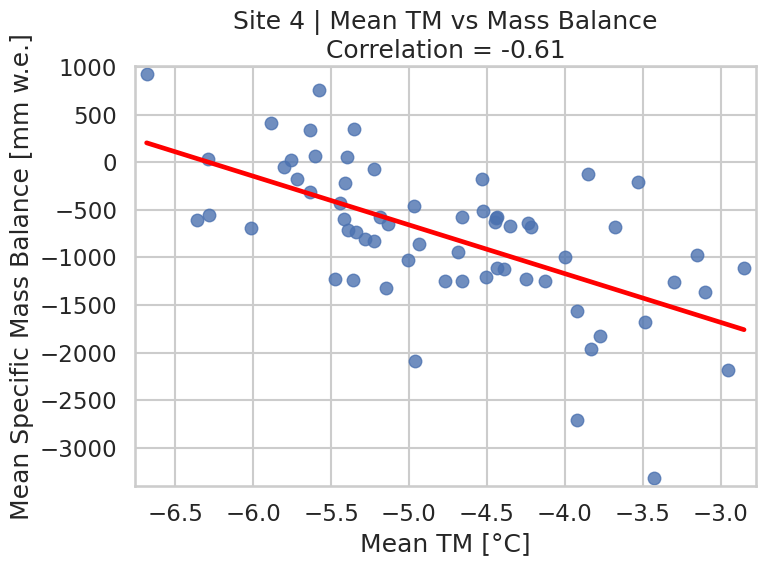

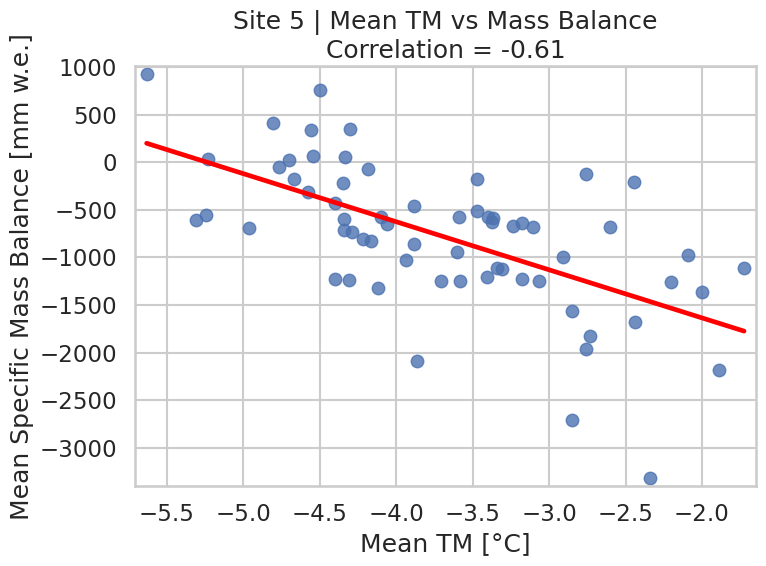

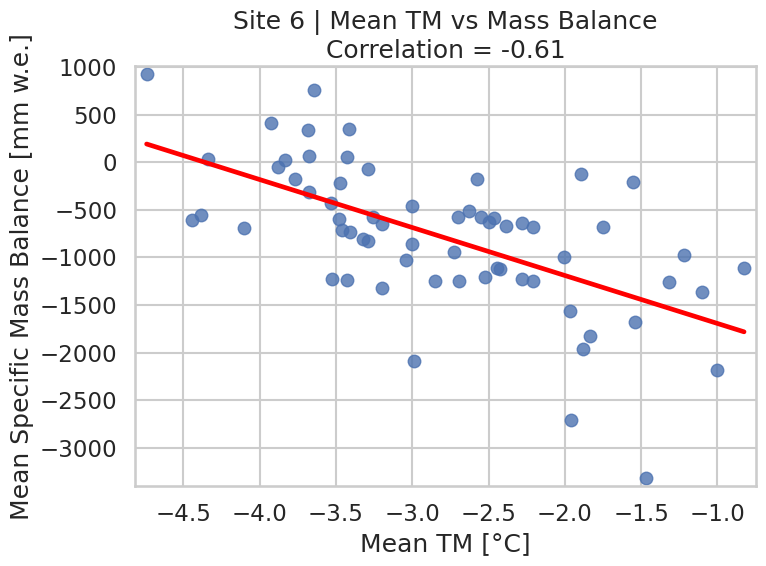

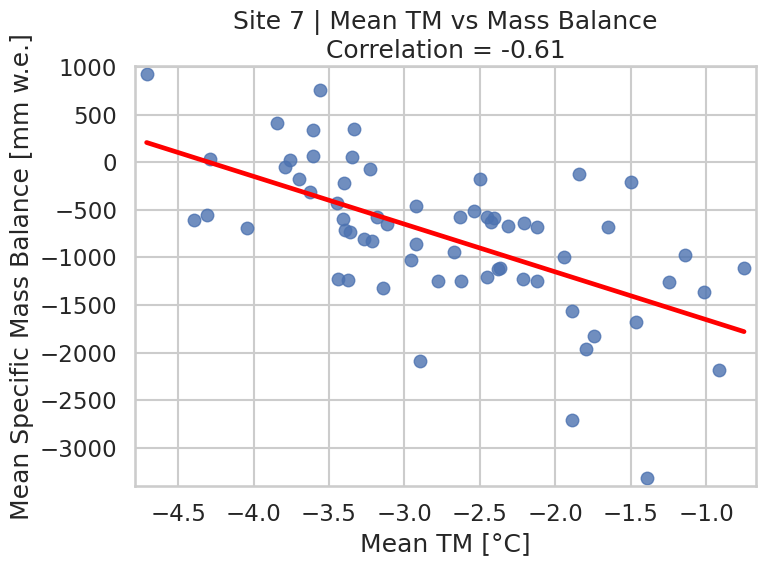

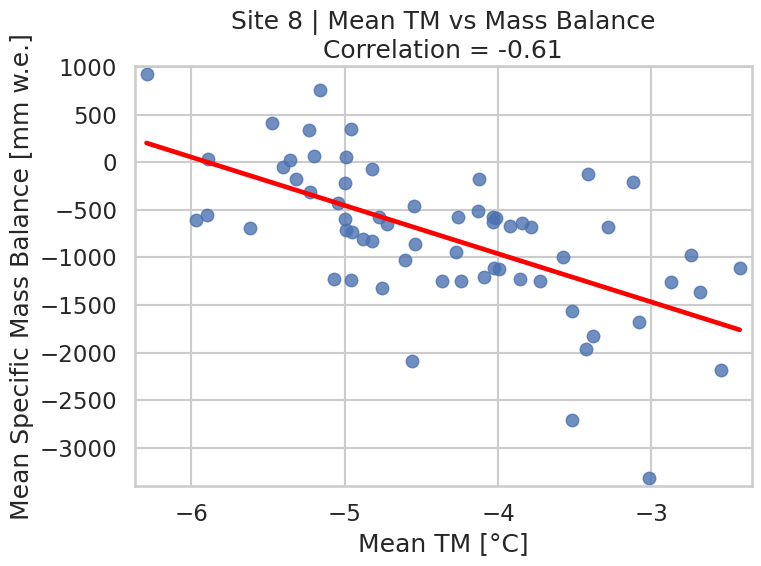

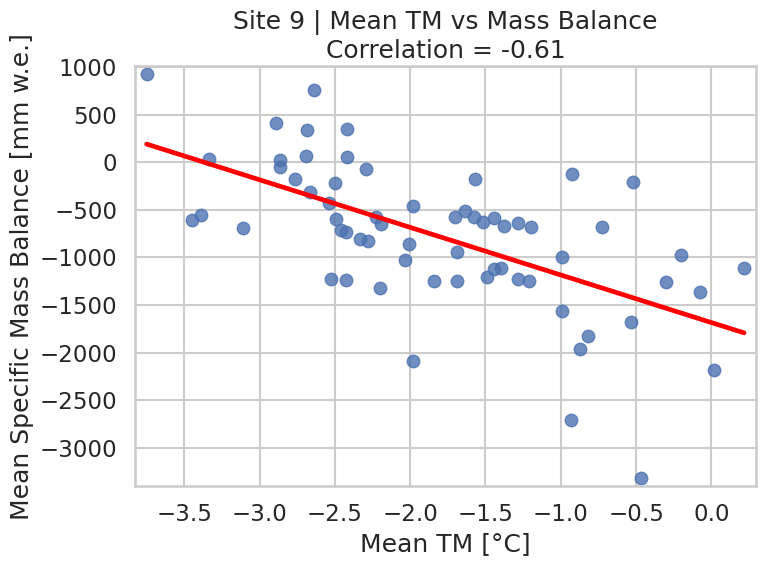

In [60]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Make sure the time column is datetime and site column is present
df_spartacus_monthly['time'] = pd.to_datetime(df_spartacus_monthly['time'])

# Loop through each site
for site, df_site in df_spartacus_monthly.groupby("site"):

    # Step 1: Compute mean TM per hydrological year for this site
    df_tm_by_year = df_site.groupby("hydrological_year")["TM [degree_Celsius]"].mean()

    # Step 2: Get mass balance data, indexed by hydrological year
    df_mb_by_year = df_hef_combined_MB.set_index("hydrological_year")["mean specific mass balance"]

    # Step 3: Align common years
    common_years = df_tm_by_year.index.intersection(df_mb_by_year.index)
    tm_common = df_tm_by_year.loc[common_years]
    mb_common = df_mb_by_year.loc[common_years]

    # Skip if too few points
    if len(common_years) < 3:
        print(f"Skipping Site {site}: not enough data points")
        continue

    # Step 4: Combine into one DataFrame
    df_plot = pd.DataFrame({
        "Mean TM [°C]": tm_common,
        "Mean Specific Mass Balance [mm w.e.]": mb_common
    })

    # Step 5: Calculate correlation
    corr_value = df_plot["Mean TM [°C]"].corr(df_plot["Mean Specific Mass Balance [mm w.e.]"])

    # Step 6: Plot
    plt.figure(figsize=(8, 6))
    sns.regplot(data=df_plot, x="Mean TM [°C]", y="Mean Specific Mass Balance [mm w.e.]", ci=None, line_kws={"color": "red"})
    plt.title(f"Site {site} | Mean TM vs Mass Balance\nCorrelation = {corr_value:.2f}")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


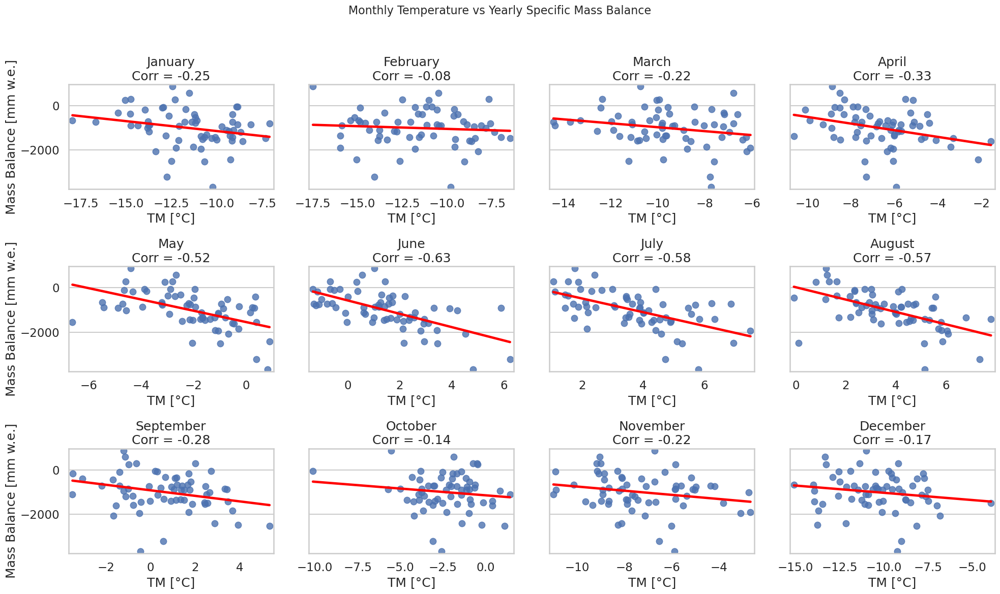

In [61]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Make sure 'time' column is datetime
df_spartacus_monthly['time'] = pd.to_datetime(df_spartacus_monthly['time'])

# Extract month name
df_spartacus_monthly['month'] = df_spartacus_monthly['time'].dt.month_name()

# Get unique months in calendar order
month_order = pd.date_range("2000-01-01", periods=12, freq='MS').strftime("%B").tolist()

# Create figure
fig, axes = plt.subplots(3, 4, figsize=(20, 12), sharey=True)
axes = axes.flatten()

for i, month in enumerate(month_order):
    ax = axes[i]

    # Filter Spartacus data to this month only
    df_month = df_spartacus_monthly[df_spartacus_monthly['month'] == month]

    # Group by hydrological year to get mean TM per year
    tm_by_year = df_month.groupby('hydrological_year')["TM [degree_Celsius]"].mean()

    # Get MB for same years
    mb_by_year = df_hef_combined_MB.set_index("hydrological_year")["climatic mass balance"]

    # Align on shared years
    common_years = tm_by_year.index.intersection(mb_by_year.index)
    x = tm_by_year.loc[common_years]
    y = mb_by_year.loc[common_years]

    # Plot
    sns.regplot(x=x, y=y, ax=ax, ci=None, line_kws={"color": "red"})
    corr = x.corr(y)
    ax.set_title(f"{month}\nCorr = {corr:.2f}")
    ax.set_xlabel("TM [°C]")
    if i % 4 == 0:
        ax.set_ylabel("Mass Balance [mm w.e.]")
    else:
        ax.set_ylabel("")

plt.suptitle("Monthly Temperature vs Yearly Specific Mass Balance", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


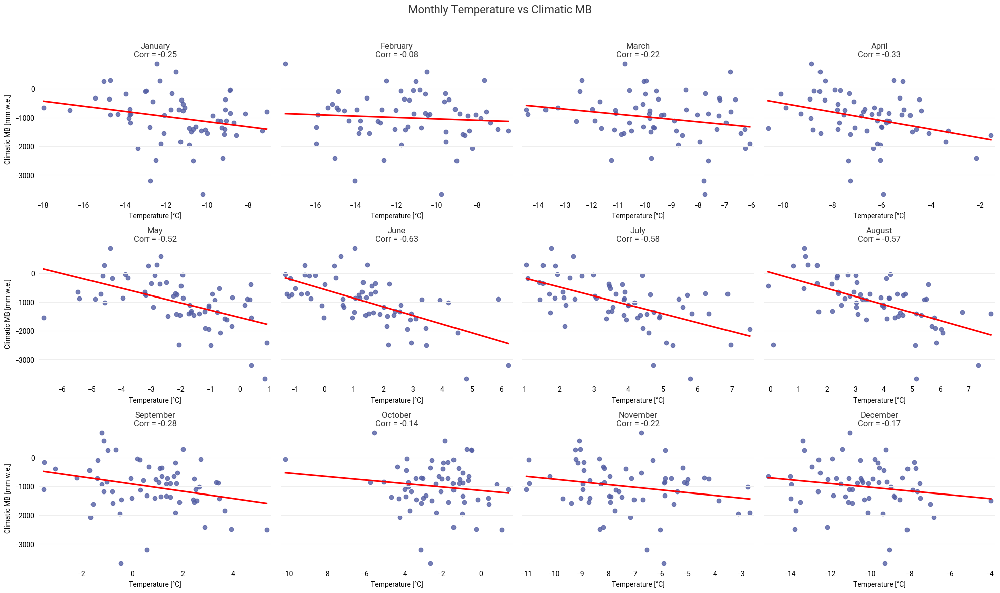

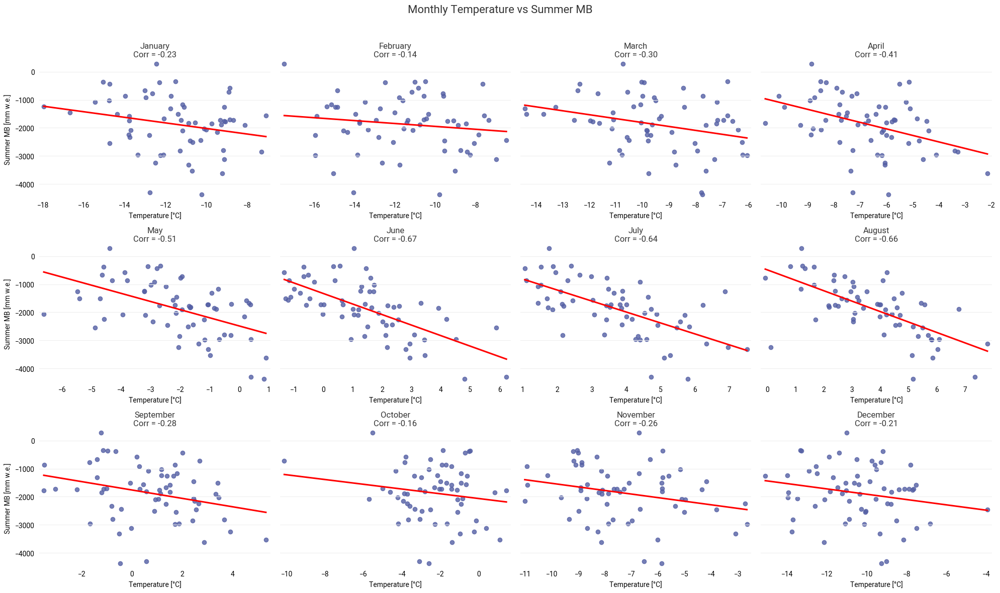

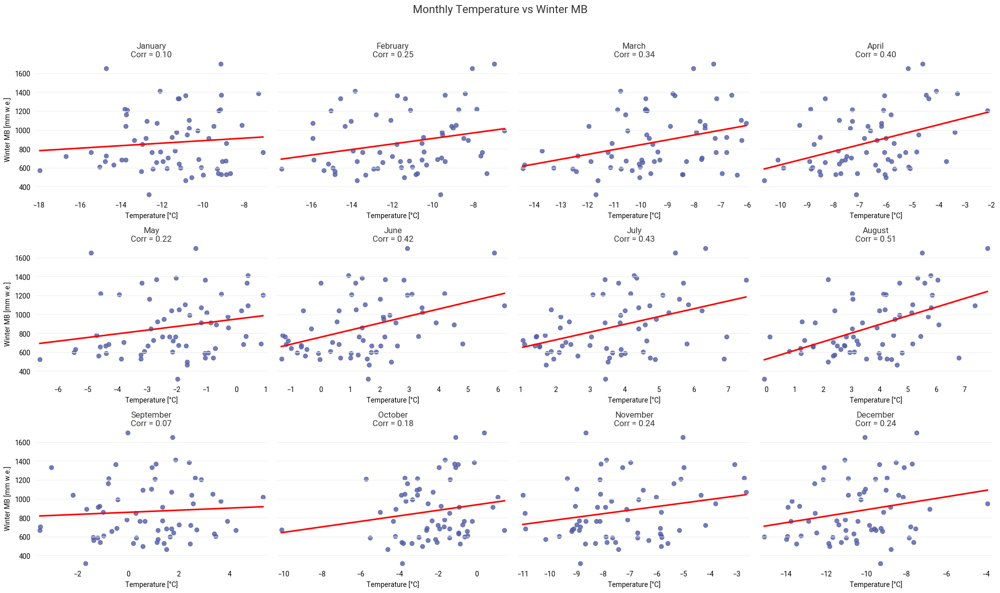

In [26]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Ensure datetime and extract month name
df_spartacus_monthly['time'] = pd.to_datetime(df_spartacus_monthly['time'])
df_spartacus_monthly['month'] = df_spartacus_monthly['time'].dt.month_name()

# Sort months in calendar order
month_order = pd.date_range("2000-01-01", periods=12, freq='MS').strftime("%B").tolist()

# Define which mass balance components to compare
mb_variables = {
    'climatic mass balance': 'Climatic MB',
    'summer balance': 'Summer MB',
    'combined winter balance': 'Winter MB'
}

# Loop through each MB variable
for mb_var, mb_label in mb_variables.items():
    fig, axes = plt.subplots(3, 4, figsize=(20, 12), sharey=True)
    axes = axes.flatten()

    for i, month in enumerate(month_order):
        ax = axes[i]

        # Filter Spartacus to this month
        df_month = df_spartacus_monthly[df_spartacus_monthly['month'] == month]

        # Mean temperature per hydrological year for this month
        tm_by_year = df_month.groupby('hydrological_year')["TM [degree_Celsius]"].mean()

        # Get matching MB data
        mb_by_year = df_hef_combined_MB.set_index("hydrological_year")[mb_var]

        # Align years
        common_years = tm_by_year.index.intersection(mb_by_year.index)
        x = tm_by_year.loc[common_years]
        y = mb_by_year.loc[common_years]

        # Plot
        sns.regplot(x=x, y=y, ax=ax, ci=None, line_kws={"color": "red"})
        corr = x.corr(y)
        ax.set_title(f"{month}\nCorr = {corr:.2f}")
        ax.set_xlabel("Temperature [°C]")
        if i % 4 == 0:
            ax.set_ylabel(f"{mb_label} [mm w.e.]")
        else:
            ax.set_ylabel("")

    plt.suptitle(f"Monthly Temperature vs {mb_label}", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show() 

Index(['time', 'RR [kg m-2]', 'SA [s]', 'TM [degree_Celsius]', 'lat', 'lon',
       'month', 'year'],
      dtype='object')


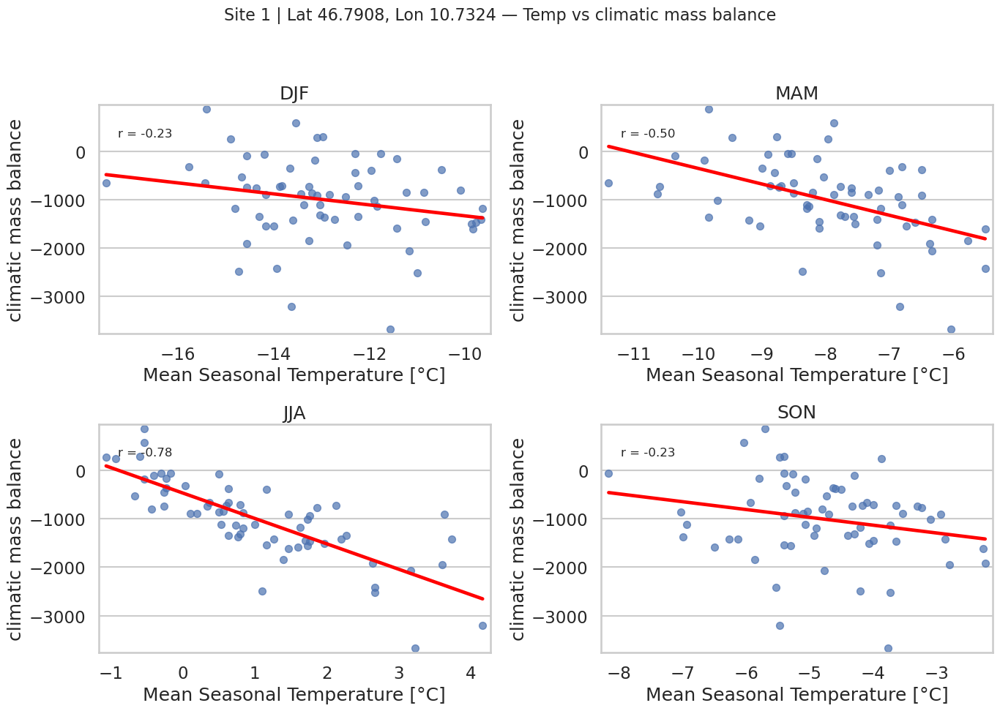

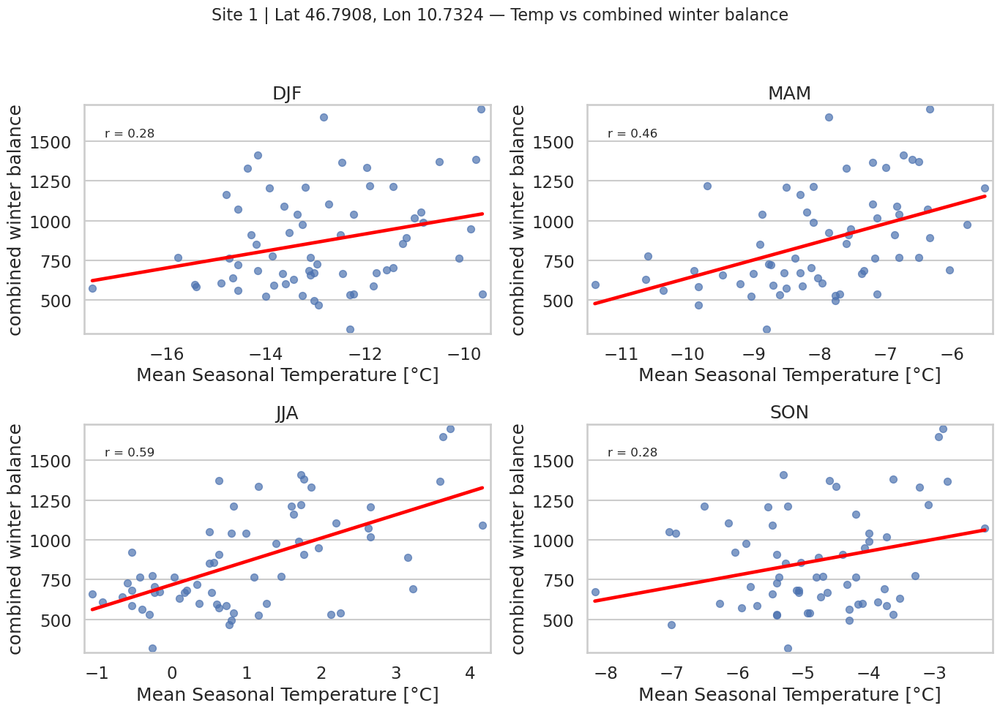

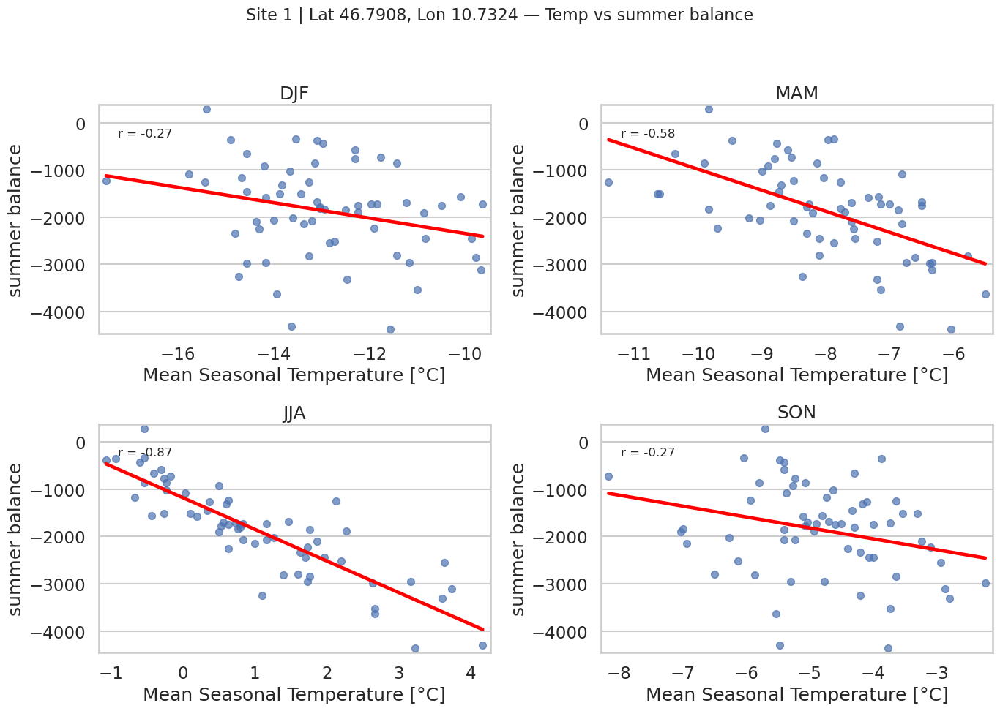

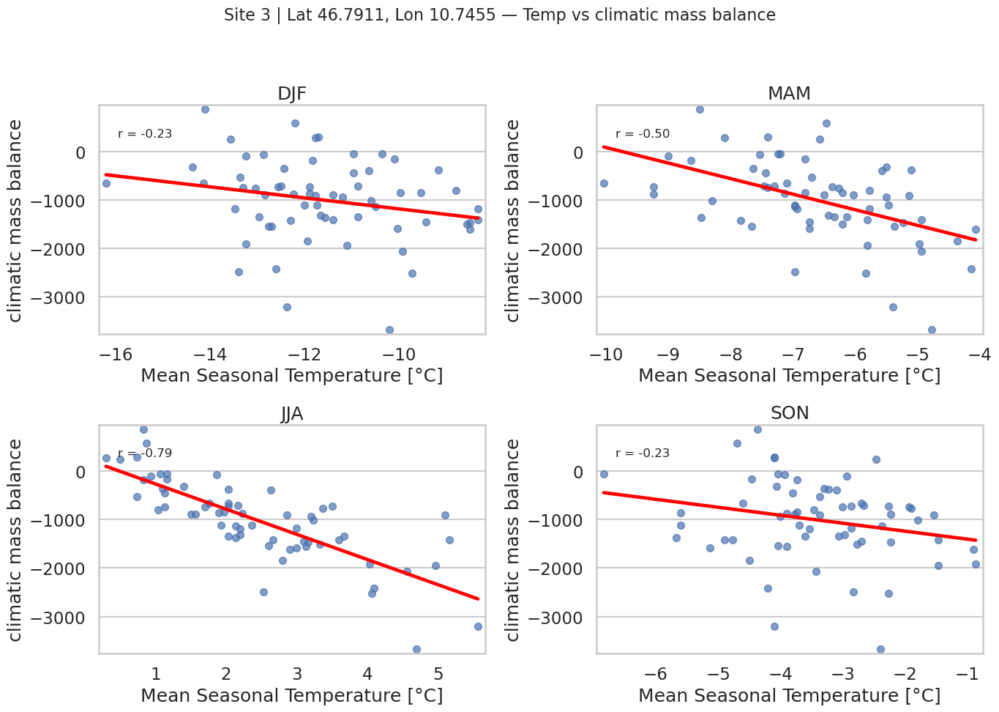

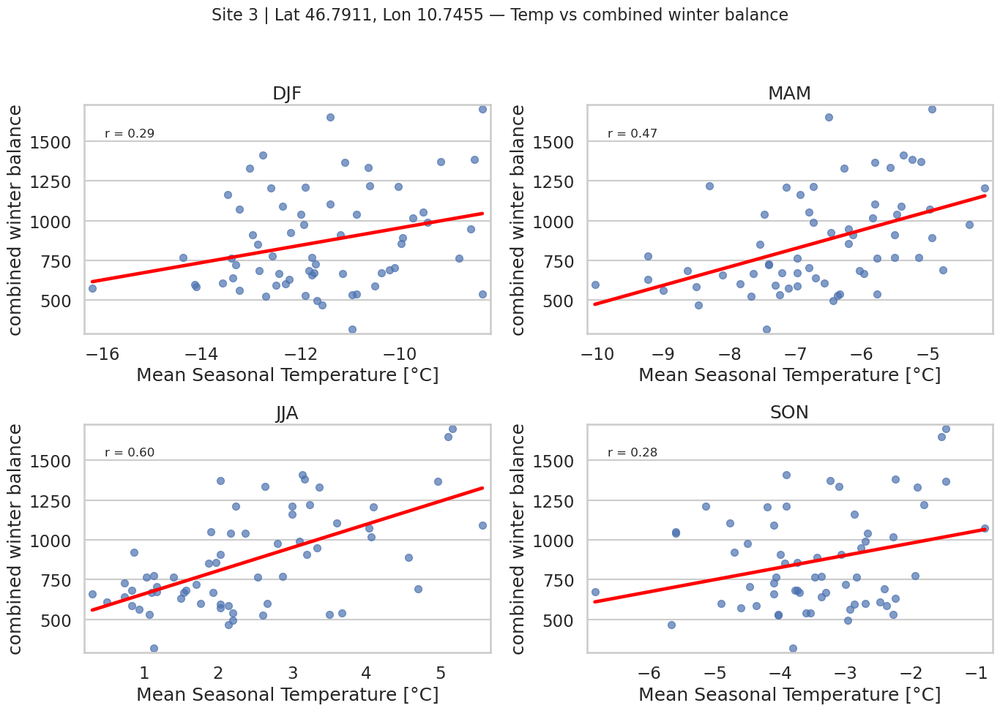

...

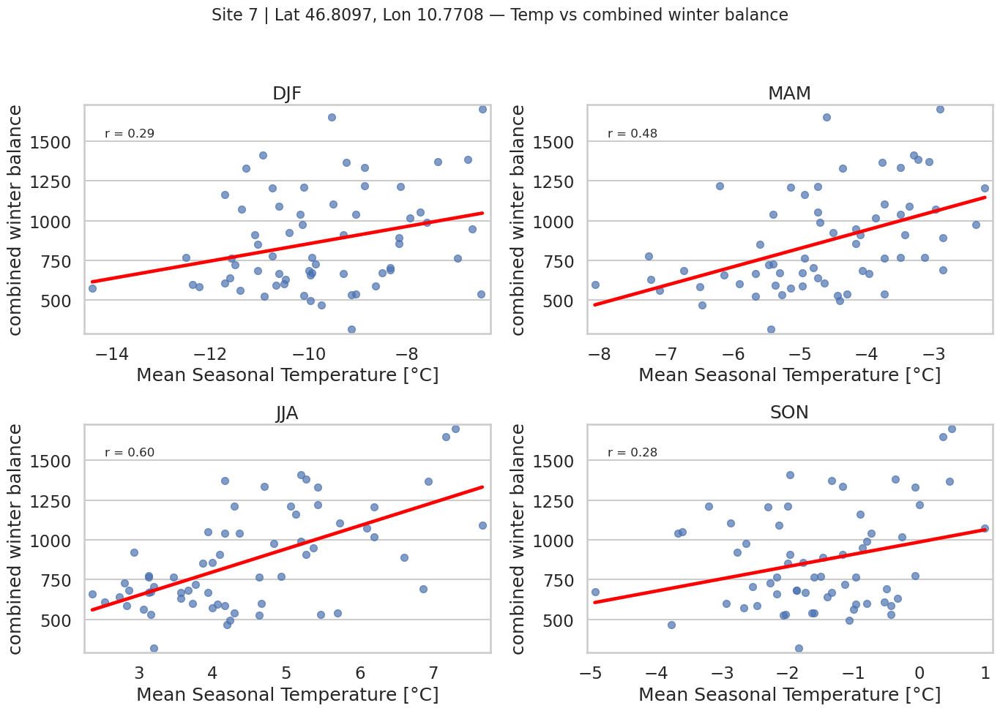

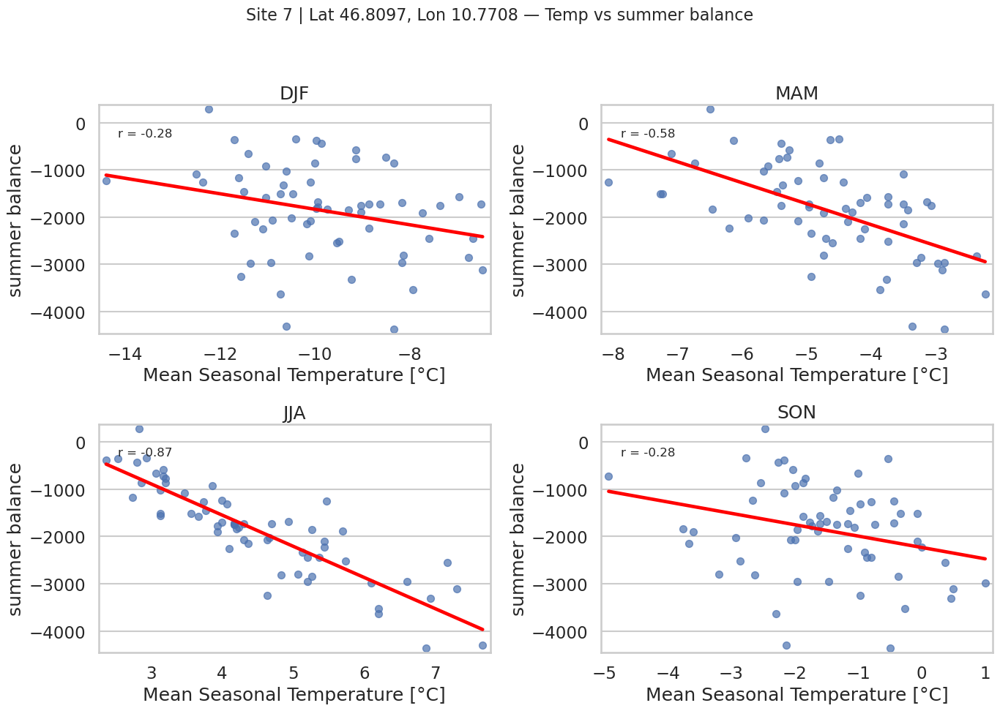

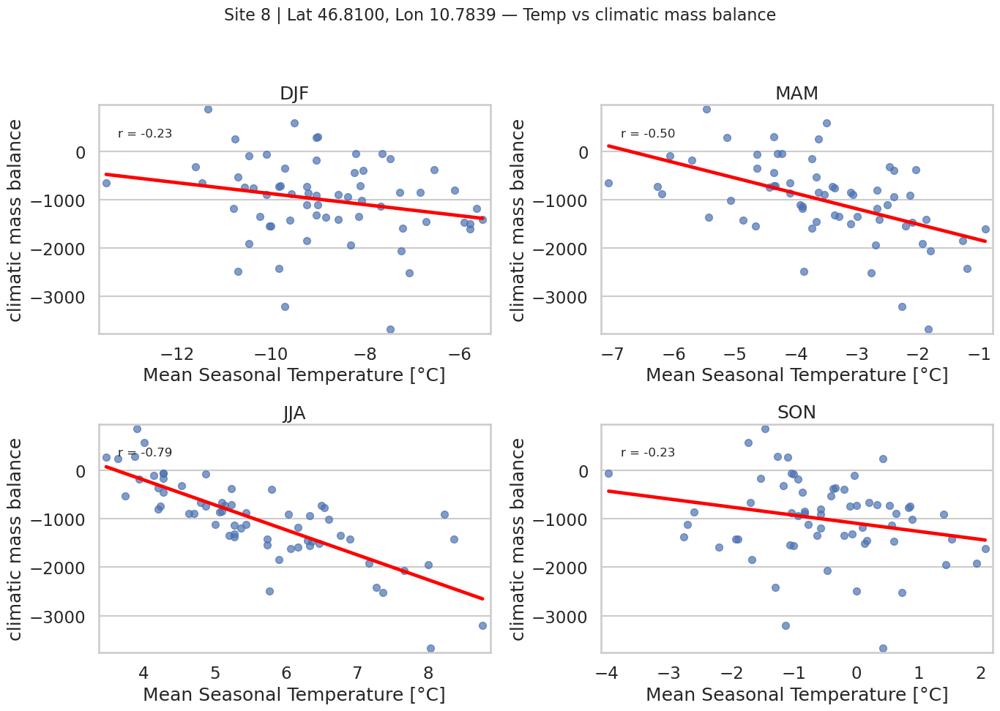

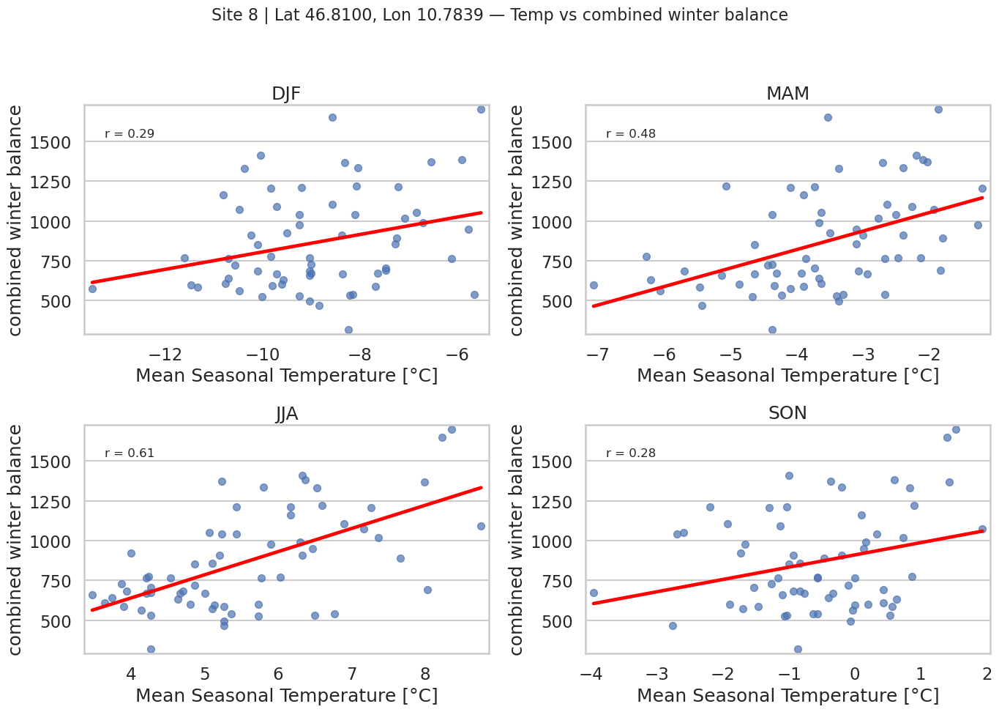

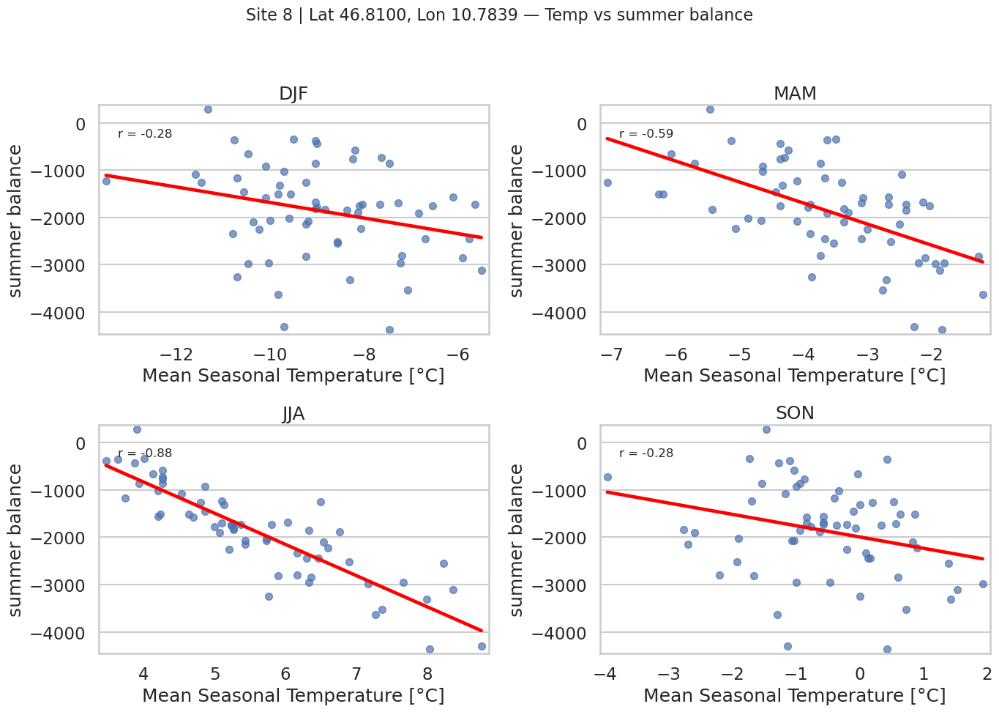

In [50]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# Load SPARTACUS data
df_spartacus_monthly = pd.read_csv('SPARTACUS_data//SPARTACUS - Spatial Dataset for Climate in Austria Datensatz_196101_202505.csv')

# Load mass balance data (you must define df_hef_combined_MB earlier)
# df_hef_combined_MB = pd.read_csv(...) or define however you do it

# Parse datetime and assign month/year
df_spartacus_monthly['time'] = pd.to_datetime(df_spartacus_monthly['time'])
df_spartacus_monthly['month'] = df_spartacus_monthly['time'].dt.month
df_spartacus_monthly['year'] = df_spartacus_monthly['time'].dt.year

print(df_spartacus_monthly.columns)


# Assign seasons
def assign_season(month):
    if month in [12, 1, 2]:
        return 'DJF'
    elif month in [3, 4, 5]:
        return 'MAM'
    elif month in [6, 7, 8]:
        return 'JJA'
    else:
        return 'SON'

df_spartacus_monthly['season'] = df_spartacus_monthly['month'].apply(assign_season)

# Assign hydrological season year
def assign_season_hydro_year(row):
    if row['season'] == 'DJF':
        return row['year'] + 1 if row['month'] == 12 else row['year']
    elif row['season'] == 'SON':
        return row['year'] + 1
    else:
        return row['year']

df_spartacus_monthly['season_hydro_year'] = df_spartacus_monthly.apply(assign_season_hydro_year, axis=1)

# Assign site numbers
locations = df_spartacus_monthly[['lat', 'lon']].drop_duplicates().reset_index(drop=True)
locations['site'] = locations.index
df_spartacus_monthly = df_spartacus_monthly.merge(locations, on=['lat', 'lon'], how='left')

# Group by site
grouped = df_spartacus_monthly.groupby(['lat', 'lon', 'site'])

# Plot settings
sns.set(style="whitegrid", context="talk")
mb_columns = ['climatic mass balance', 'combined winter balance', 'summer balance']
seasons = ['DJF', 'MAM', 'JJA', 'SON']

for (lat, lon, site), df_loc in grouped:
    # Calculate seasonal temperature means
    seasonal_means = df_loc.groupby(['season_hydro_year', 'season'])[['TM [degree_Celsius]']].mean().reset_index()

    # Merge with mass balance data
    df_merged = pd.merge(seasonal_means, df_hef_combined_MB, left_on='season_hydro_year', right_on='hydrological_year')

    for mb in mb_columns:
        fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharex=False, sharey=False)
        axes = axes.flatten()

        for i, season in enumerate(seasons):
            ax = axes[i]
            data = df_merged[df_merged['season'] == season].dropna(subset=['TM [degree_Celsius]', mb])

            sns.regplot(
                data=data,
                x='TM [degree_Celsius]',
                y=mb,
                ax=ax,
                scatter_kws={'s':50, 'alpha':0.7},
                line_kws={'color':'red'},
                ci=None
            )

            if len(data) > 1:
                r, p = pearsonr(data['TM [degree_Celsius]'], data[mb])
                ax.text(0.05, 0.9, f'r = {r:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')
            else:
                ax.text(0.05, 0.9, 'r = N/A', transform=ax.transAxes, fontsize=12, verticalalignment='top')

            ax.set_title(f'{season}')
            ax.set_xlabel('Mean Seasonal Temperature [°C]')
            ax.set_ylabel(mb)

        fig.suptitle(f'Site {site} | Lat {lat:.4f}, Lon {lon:.4f} — Temp vs {mb}', fontsize=16)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()


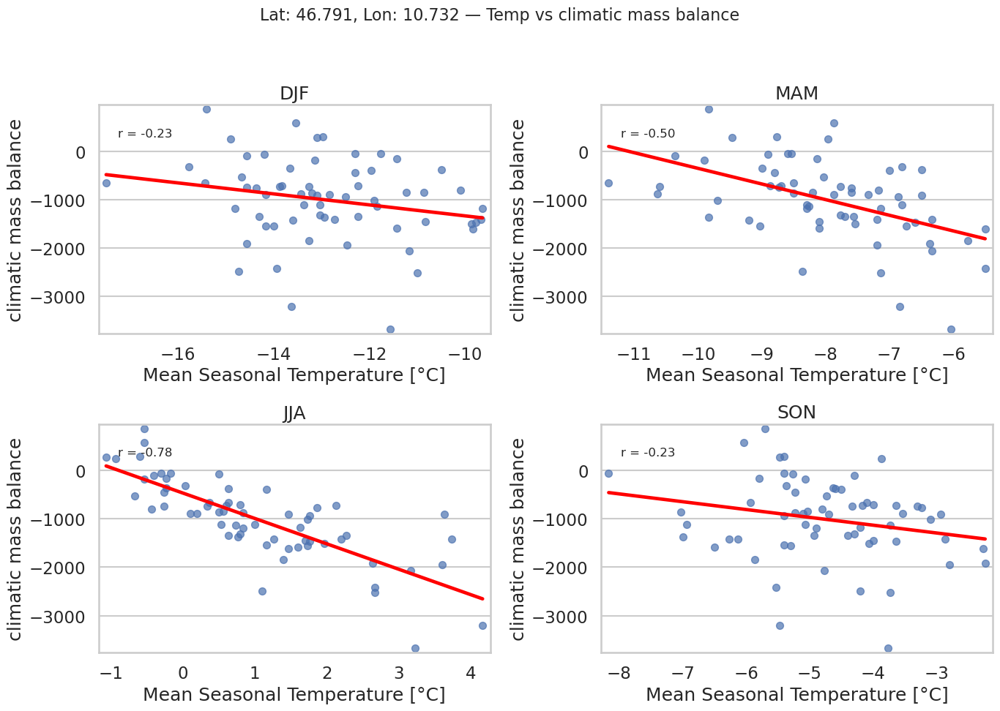

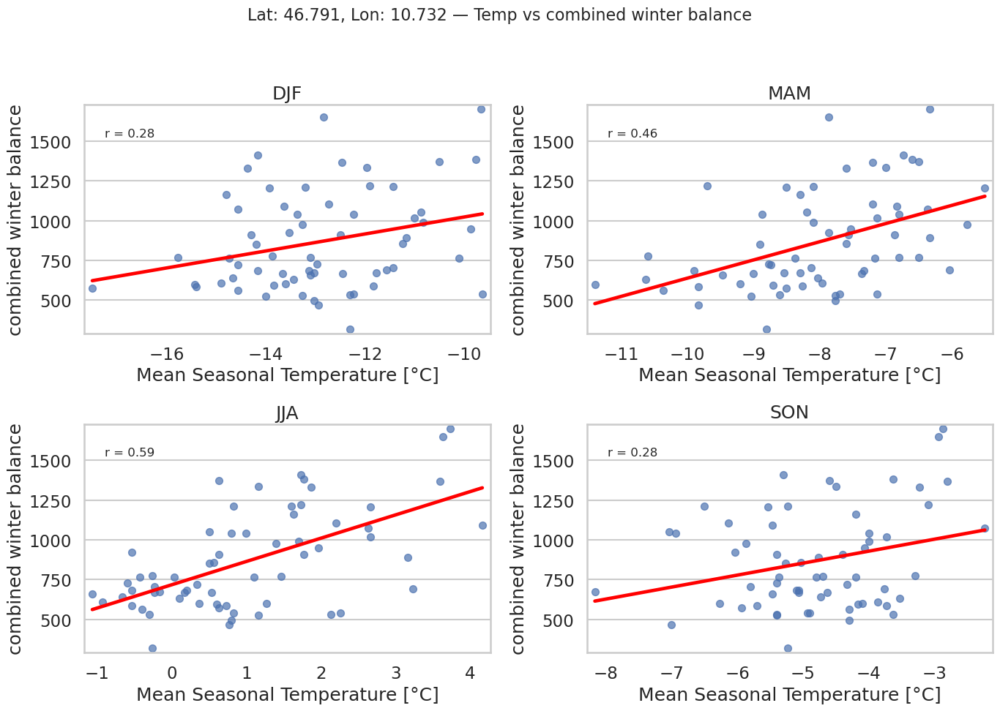

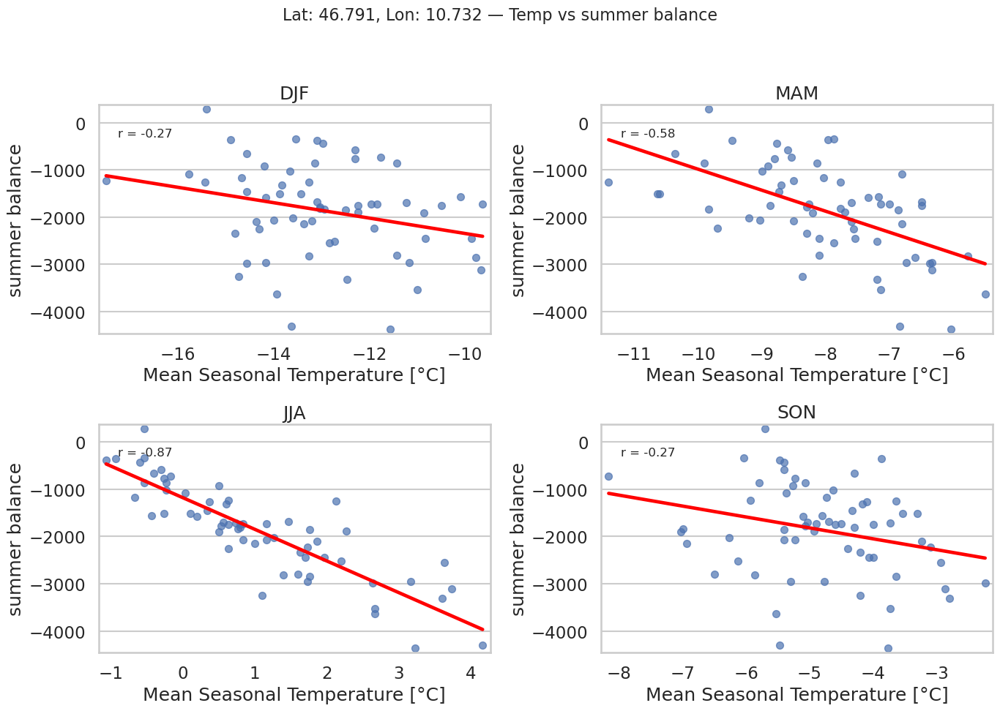

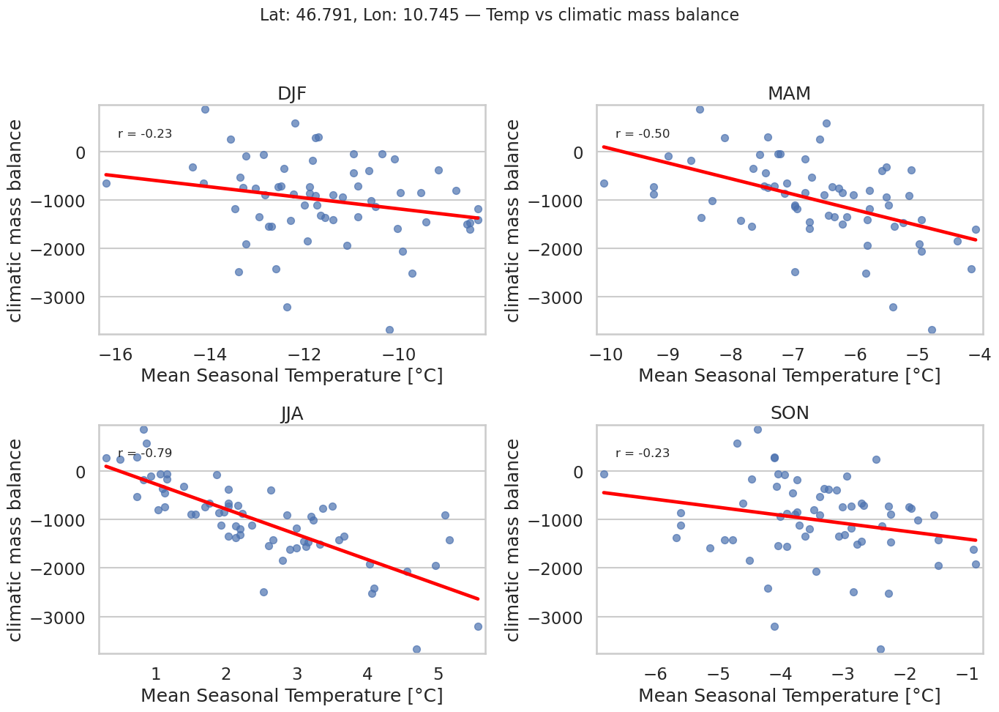

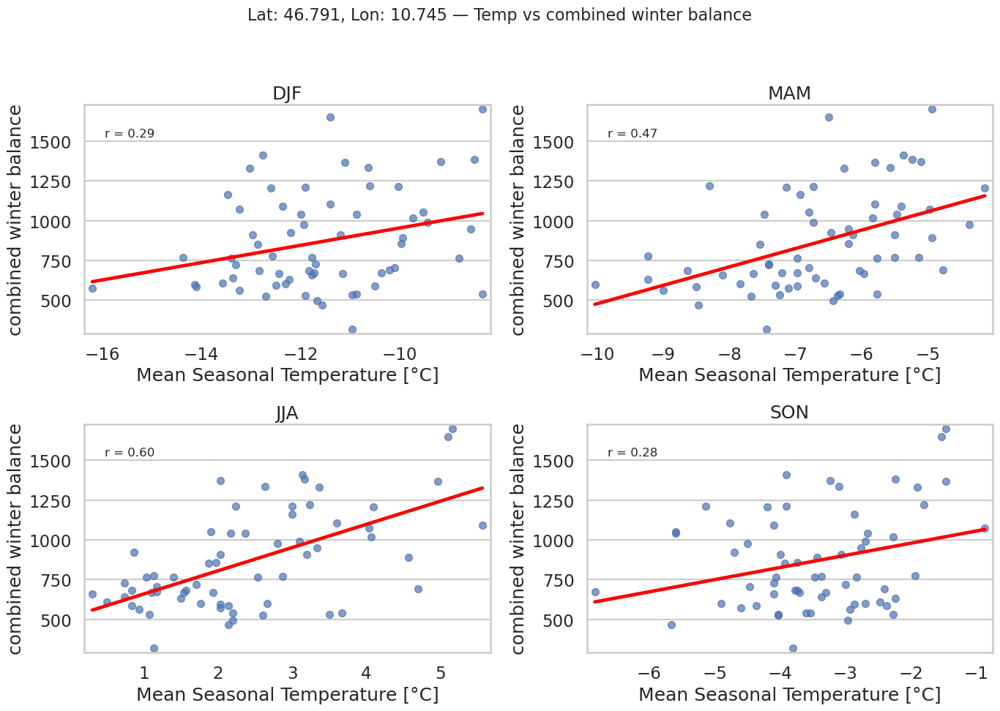

...

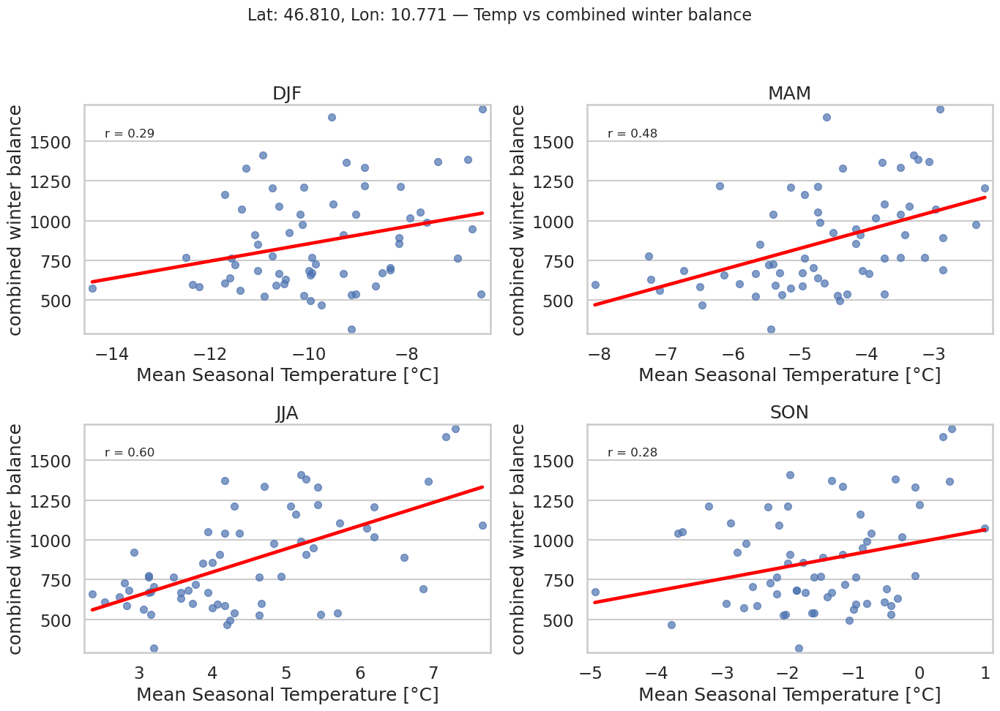

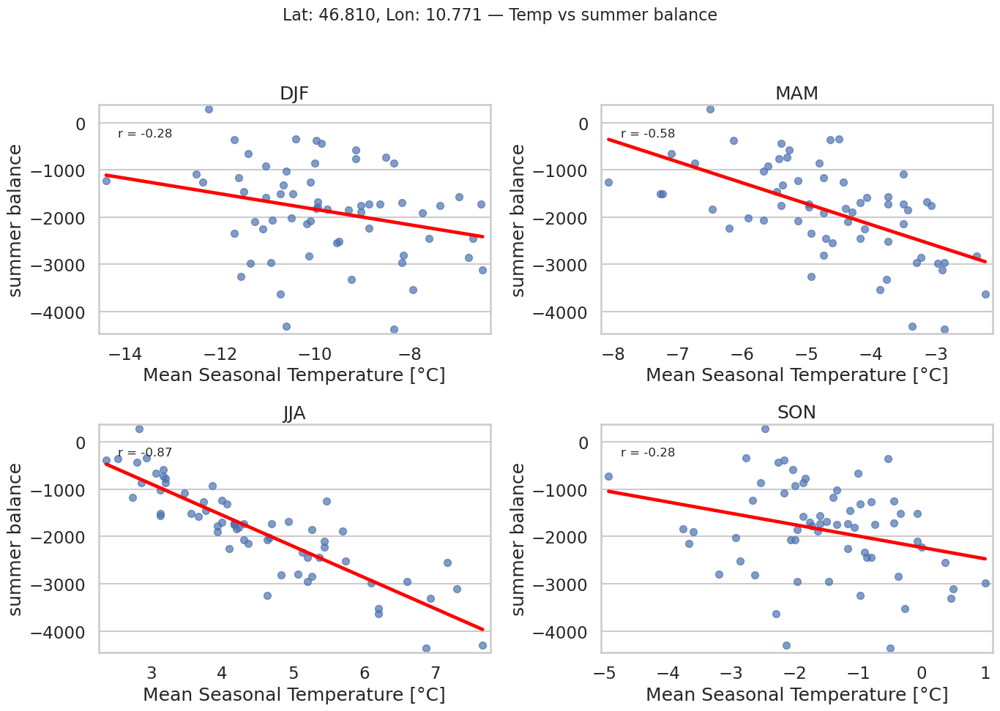

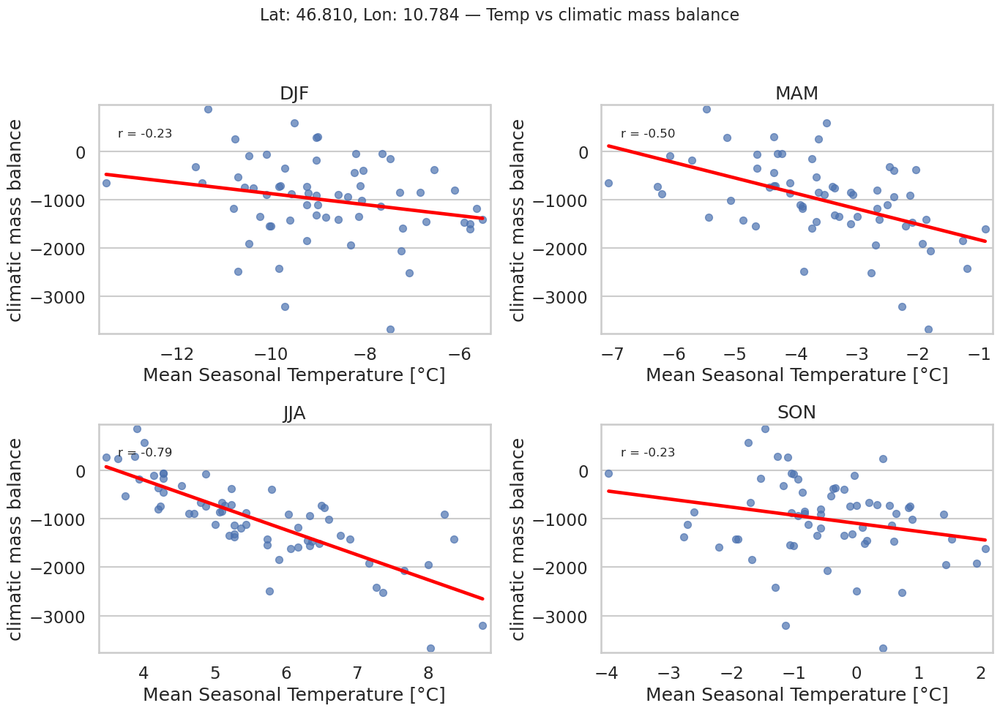

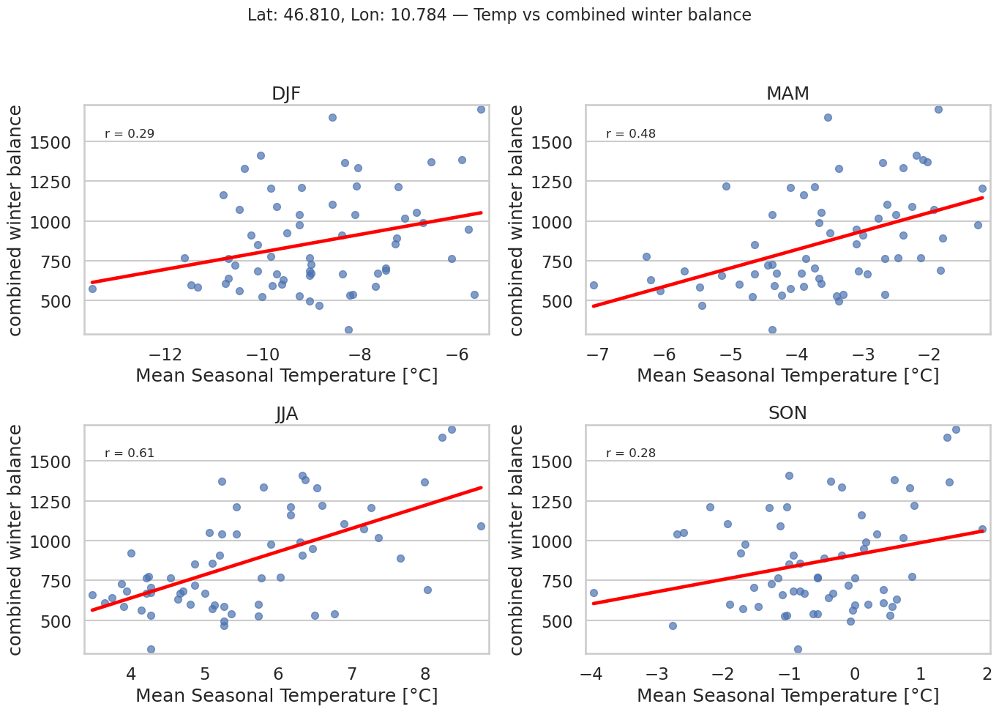

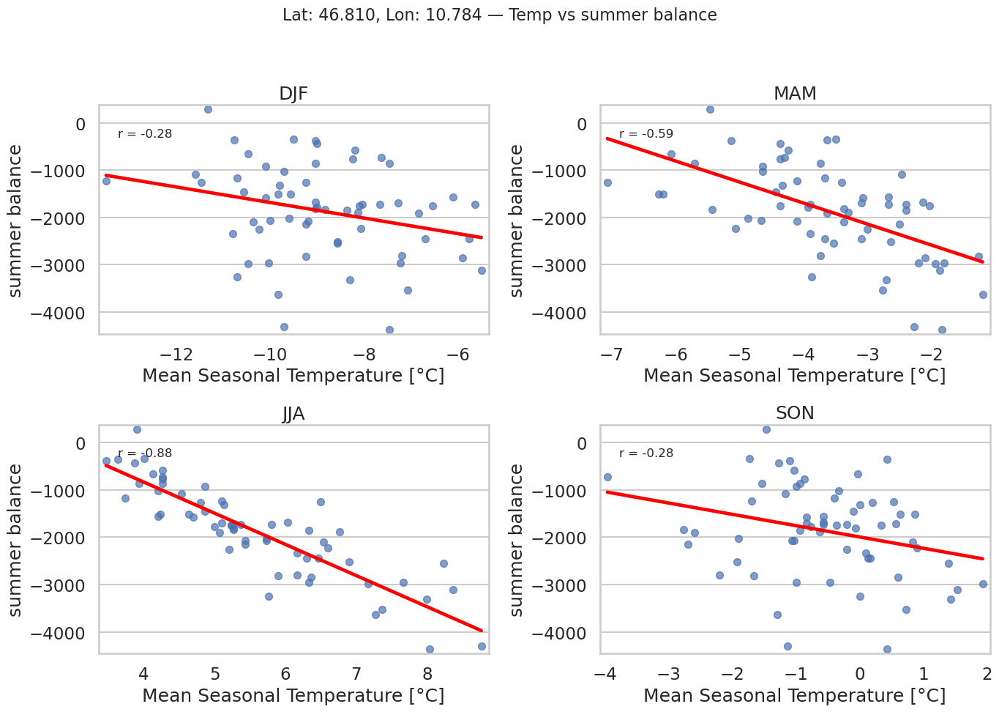

In [46]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# Assume df_spartacus_monthly and df_hef_combined_MB are already loaded

# Process time and add season/hydro year
df_spartacus_monthly['time'] = pd.to_datetime(df_spartacus_monthly['time'])
df_spartacus_monthly['month'] = df_spartacus_monthly['time'].dt.month
df_spartacus_monthly['year'] = df_spartacus_monthly['time'].dt.year

def assign_season(month):
    if month in [12, 1, 2]:
        return 'DJF'
    elif month in [3, 4, 5]:
        return 'MAM'
    elif month in [6, 7, 8]:
        return 'JJA'
    else:
        return 'SON'

df_spartacus_monthly['season'] = df_spartacus_monthly['month'].apply(assign_season)

def assign_season_hydro_year(row):
    if row['season'] == 'DJF':
        return row['year'] + 1 if row['month'] == 12 else row['year']
    elif row['season'] == 'SON':
        return row['year'] + 1
    else:
        return row['year']

df_spartacus_monthly['season_hydro_year'] = df_spartacus_monthly.apply(assign_season_hydro_year, axis=1)

# Now group by lat/lon
grouped = df_spartacus_monthly.groupby(['lat', 'lon'])

# Mass balance columns to correlate with
mb_columns = ['climatic mass balance', 'combined winter balance', 'summer balance']
seasons = ['DJF', 'MAM', 'JJA', 'SON']

# Plot settings
sns.set(style="whitegrid", context="talk")

# Loop over each point location
for (lat, lon), df_loc in grouped:
    # Compute seasonal mean temperature per hydro year
    seasonal_means = df_loc.groupby(['season_hydro_year', 'season'])[
        'TM [degree_Celsius]'
    ].mean().reset_index()

    # Merge with mass balance
    df_merged = pd.merge(seasonal_means, df_hef_combined_MB, 
                         left_on='season_hydro_year', 
                         right_on='hydrological_year')

    if df_merged.empty:
        print(f"Skipping lat={lat}, lon={lon} (no overlap with mass balance years)")
        continue

    # Plot for each MB variable
    for mb in mb_columns:
        fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharex=False, sharey=False)
        axes = axes.flatten()

        for i, season in enumerate(seasons):
            ax = axes[i]
            data = df_merged[df_merged['season'] == season].dropna(subset=['TM [degree_Celsius]', mb])

            sns.regplot(
                data=data,
                x='TM [degree_Celsius]',
                y=mb,
                ax=ax,
                scatter_kws={'s':50, 'alpha':0.7},
                line_kws={'color':'red'},
                ci=None
            )

            if len(data) > 1:
                r, p = pearsonr(data['TM [degree_Celsius]'], data[mb])
                ax.text(0.05, 0.9, f'r = {r:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')
            else:
                ax.text(0.05, 0.9, 'r = N/A', transform=ax.transAxes, fontsize=12, verticalalignment='top')

            ax.set_title(f'{season}')
            ax.set_xlabel('Mean Seasonal Temperature [°C]')
            ax.set_ylabel(mb)

        fig.suptitle(f'Lat: {lat:.3f}, Lon: {lon:.3f} — Temp vs {mb}', fontsize=16)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()



In [33]:
print(df_merged.columns.tolist())


['season_hydro_year', 'season', 'TM [degree_Celsius]', 'calendar_year', 'hydrological_year', 'mean specific mass balance', 'climatic mass balance', 'winter mass balance', 'winter mass balance B06', 'comment B06', 'winter mass balance K99', 'combined winter balance', 'summer balance']


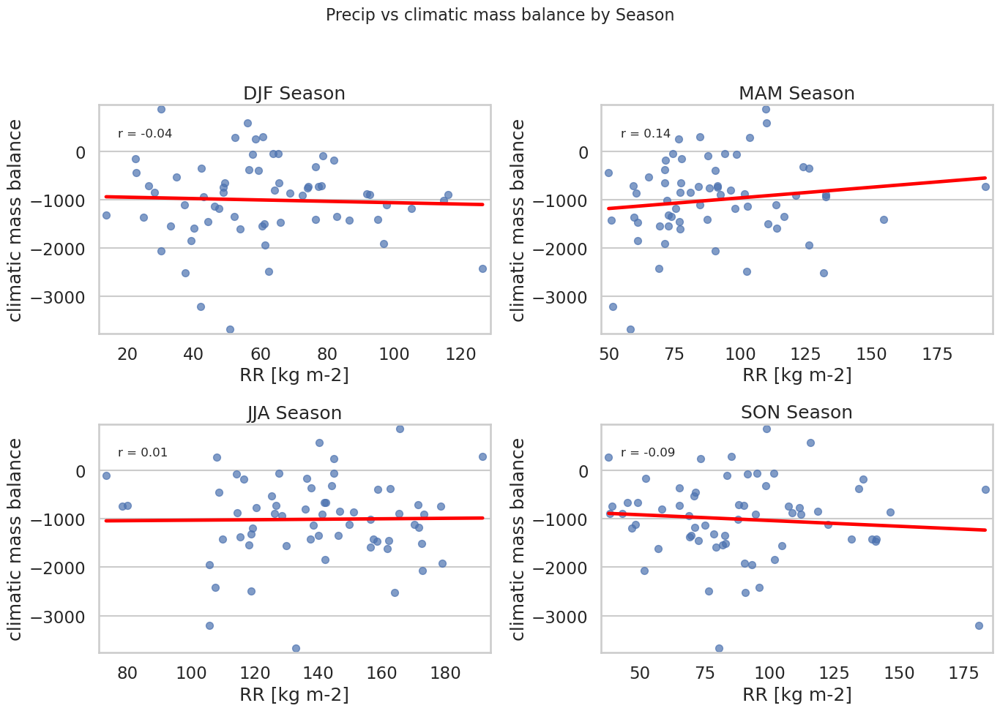

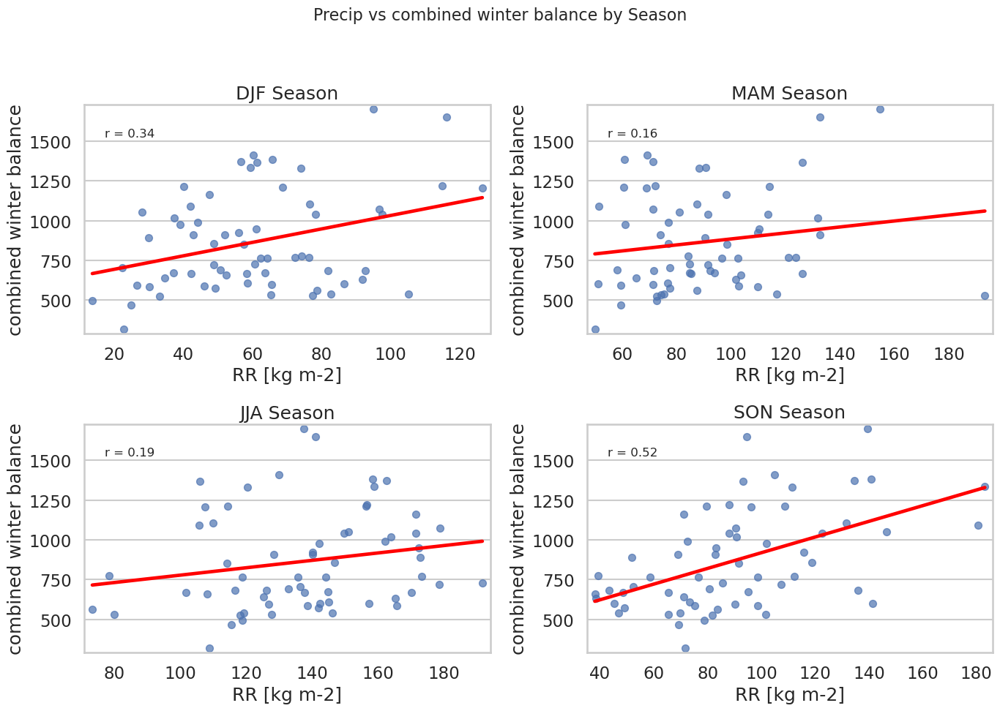

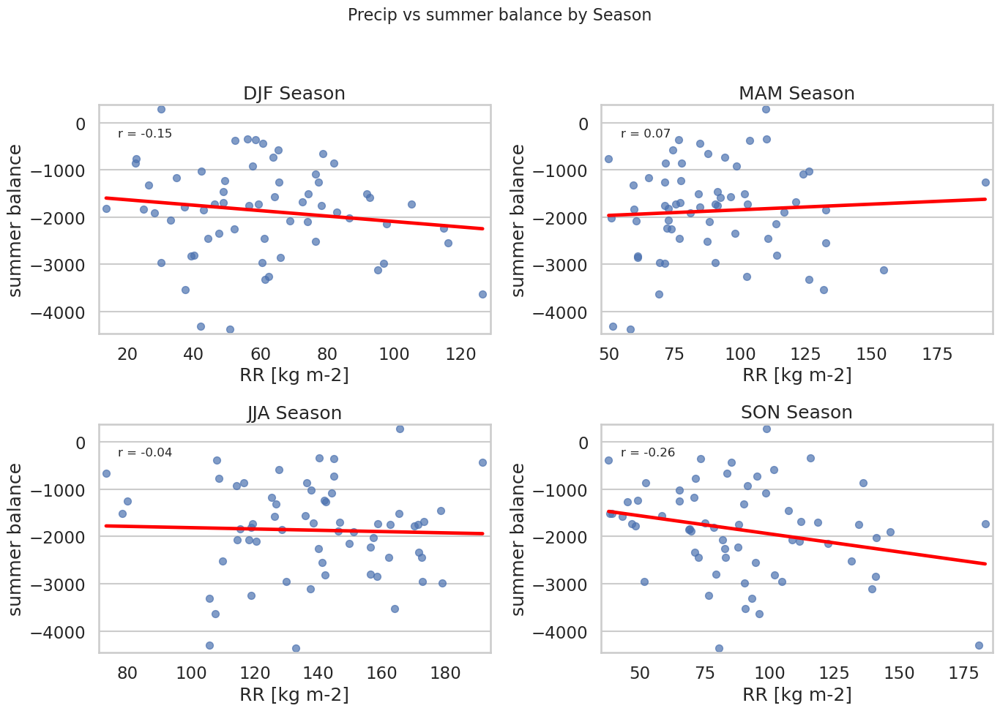

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# Assuming df_spartacus_monthly and df_hef_combined_MB are already prepared as before


precip_seasonal_means = df_spartacus_monthly.groupby(['season_hydro_year', 'season'])[
    ['RR [kg m-2]']
].mean().reset_index()

df_merged = pd.merge(precip_seasonal_means, df_hef_combined_MB, left_on='season_hydro_year', right_on='hydrological_year')

mb_columns = ['climatic mass balance','combined winter balance', 'summer balance']
seasons = ['DJF', 'MAM', 'JJA', 'SON']

sns.set(style="whitegrid", context="talk")
for mb in mb_columns:
    fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharex=False, sharey=False)
    axes = axes.flatten()
    
    for i, season in enumerate(seasons):
        ax = axes[i]
        data = df_merged[df_merged['season'] == season].dropna(subset=['RR [kg m-2]', mb])
        
        sns.regplot(
            data=data,
            x='RR [kg m-2]',
            y=mb,
            ax=ax,
            scatter_kws={'s':50, 'alpha':0.7},
            line_kws={'color':'red'},
            ci=None  # no confidence interval to avoid error
        )
        
        if len(data) > 1:
            r, p = pearsonr(data['RR [kg m-2]'], data[mb])
            ax.text(0.05, 0.9, f'r = {r:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')
        else:
            ax.text(0.05, 0.9, 'r = N/A', transform=ax.transAxes, fontsize=12, verticalalignment='top')
        
        ax.set_title(f'{season} Season')
        ax.set_xlabel('RR [kg m-2]')
        ax.set_ylabel(mb)
        
    fig.suptitle(f'Precip vs {mb} by Season', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()
